In [1]:
# Cell 1: Imports and utility libraries
import os
import random
import time
import pickle
import logging

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
from tqdm import tqdm

from skimage.measure import label
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import label_binarize

import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
import torchvision.models as models


In [2]:
# Cell 2: Parse file paths and labels
def parse_file(file_path, root_dir, root_dir_view):
    image_paths = []
    labels = []
    with open(file_path, 'r') as f:
        for line in f:
            line = line.strip()
            if line:
                label_file_path = os.path.join(root_dir_view, os.path.splitext(line)[0] + ".txt")
                if os.path.exists(label_file_path):
                    with open(label_file_path, 'r') as label_file:
                        first_line = label_file.readline().strip()
                        if first_line in {'-1', '1', '2', '3', '4', '5'}:
                            # Here the label is taken as the integer from the first folder in the path.
                            label_val = int(line.split('/')[0])
                            labels.append(label_val)
                            image_paths.append(os.path.join(root_dir, line))
    return image_paths, labels

# Define directories and file paths (change these as needed)
train_file_path = "/data/NNDL/data/train_test_split/classification/train.txt"
test_file_path  = "/data/NNDL/data/train_test_split/classification/test.txt"
root_dir      = "/data/NNDL/data/image/"
root_dir_view = "/data/NNDL/data/label/"

# Parse train and test data
train_image_paths, train_labels = parse_file(train_file_path, root_dir, root_dir_view)
test_image_paths, test_labels   = parse_file(test_file_path, root_dir, root_dir_view)

# Aggregate all labels and build a mapping to 0-based indices
all_labels = sorted(set(train_labels + test_labels))
print(f"Min label: {min(all_labels)}, Max label: {max(all_labels)}")
print(f"Expected label range: [0, {len(all_labels) - 1}]")

label_to_idx = {label: idx for idx, label in enumerate(all_labels)}
# Remap labels
train_labels = [label_to_idx[label] for label in train_labels]
test_labels  = [label_to_idx[label] for label in test_labels]

num_classes = len(label_to_idx)
print("Number of classes:", num_classes)


Min label: 4, Max label: 162
Expected label range: [0, 74]
Number of classes: 75


In [3]:
# Cell 3: Custom Dataset
class CarDataset(Dataset):
    def __init__(self, image_paths, labels, transform=None):
        self.image_paths = image_paths
        self.labels = labels
        self.transform = transform
        
    def __len__(self):
        return len(self.image_paths)
    
    def __getitem__(self, idx):
        # Load image and convert to RGB
        img_path = self.image_paths[idx]
        image = Image.open(img_path).convert('RGB')
        if self.transform:
            image = self.transform(image)
        label = self.labels[idx]
        return image, label


### Resnet

In [4]:
# Cell 4: Data transforms and splitting dataset
# Define transforms (feel free to adjust augmentation parameters)
train_transforms = transforms.Compose([
    transforms.RandomResizedCrop(224, scale=(0.7, 1.0)),  # slightly wider range if needed
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(degrees=5),  # reduce rotation
    transforms.ColorJitter(brightness=0.1, contrast=0.1, saturation=0.1, hue=0.05),  # lower intensity
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225]),
    transforms.RandomErasing(p=0.1, scale=(0.02, 0.08), ratio=(0.3, 3.3))  # lower probability and scale
])

val_transforms = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

# Split the training data into training and validation sets (80/20 split)
train_paths, val_paths, train_labels_split, val_labels_split = train_test_split(
    train_image_paths, train_labels, test_size=0.2, random_state=42
)


In [5]:
# Cell 5: Create DataLoaders
batch_size = 128

train_dataset = CarDataset(train_paths, train_labels_split, transform=train_transforms)
val_dataset   = CarDataset(val_paths, val_labels_split, transform=val_transforms)
test_dataset  = CarDataset(test_image_paths, test_labels, transform=val_transforms)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers= 16, pin_memory=True, prefetch_factor=2, persistent_workers=True)
val_loader   = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers= 16, pin_memory=True, prefetch_factor=2, persistent_workers=True)
test_loader  = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers= 16, pin_memory=True, prefetch_factor=2, persistent_workers=True)

print(f"Training dataset size: {len(train_dataset)}")
print(f"Validation dataset size: {len(val_dataset)}")
print(f"Test dataset size: {len(test_dataset)}")

Training dataset size: 12812
Validation dataset size: 3204
Test dataset size: 14939


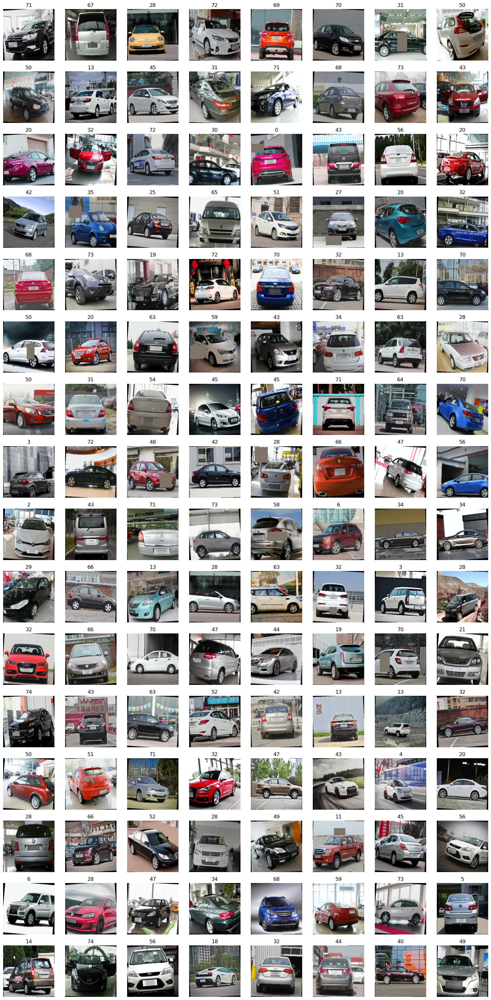

In [6]:
# Cell 6: Visualize some images from the training set
def imshow(img, mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]):
    img = img.clone().detach().cpu().numpy().transpose((1, 2, 0))
    img = std * img + mean  # unnormalize
    img = np.clip(img, 0, 1)
    plt.imshow(img)

# Get one batch from the training DataLoader
dataiter = iter(train_loader)
images, labels = next(dataiter)

def plot_images(images, labels, n_cols=8):
    n_rows = len(images) // n_cols + (len(images) % n_cols != 0)
    plt.figure(figsize=(16, 2 * n_rows))
    for i in range(len(images)):
        plt.subplot(n_rows, n_cols, i + 1)
        imshow(images[i])
        plt.title(str(labels[i].item()))
        plt.axis('off')
    plt.tight_layout()
    plt.show()

plot_images(images, labels)


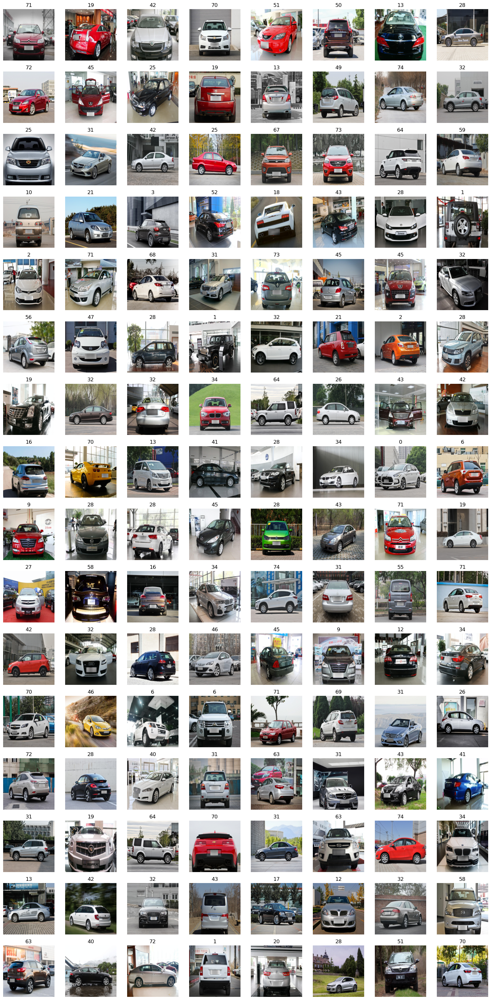

In [7]:
# Cell 6.5: Visualize some images from the validation set

# Get one batch from the validation DataLoader
dataiter_val = iter(val_loader)
val_images, val_labels = next(dataiter_val)

# Use the same 'imshow' and 'plot_images' functions from Cell 6
def plot_images(images, labels, n_cols=8):
    n_rows = len(images) // n_cols + (len(images) % n_cols != 0)
    plt.figure(figsize=(16, 2 * n_rows))
    for i in range(len(images)):
        plt.subplot(n_rows, n_cols, i + 1)
        imshow(images[i])
        plt.title(str(labels[i].item()))
        plt.axis('off')
    plt.tight_layout()
    plt.show()

plot_images(val_images, val_labels)


In [9]:
# Cell 7: Define the model (ResNet50)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

model = models.resnet50(pretrained=True)
num_ftrs = model.fc.in_features
model.fc = nn.Linear(num_ftrs, num_classes)  # modify the final layer
model_resnet50 = model.to(device)

# Print a summary of the model
print(model_resnet50)


Using device: cuda


/data/anaconda3/lib/python3.12/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/data/anaconda3/lib/python3.12/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [10]:
# Cell 8: Training loop
num_epochs = 100
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model_resnet50.parameters(), lr=0.0001, weight_decay = 1e-3)
scheduler = lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=5, verbose=True)

# Early stopping parameters
early_stopping_patience = 10
best_val_acc = 0.0
epochs_no_improve = 0

train_history = {'train_loss': [], 'train_acc': [], 'val_loss': [], 'val_acc': []}

since = time.time()

for epoch in range(num_epochs):
    print(f"Epoch {epoch+1}/{num_epochs}")
    # --- Training phase ---
    model_resnet50.train()
    running_loss = 0.0
    running_corrects = 0
    total = 0
    
    for inputs, labels in tqdm(train_loader, desc="Training", leave=False):
        inputs = inputs.to(device)
        labels = labels.to(device)
        
        optimizer.zero_grad()
        outputs = model_resnet50(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item() * inputs.size(0)
        _, preds = torch.max(outputs, 1)
        running_corrects += torch.sum(preds == labels.data)
        total += labels.size(0)
    
    epoch_loss = running_loss / total
    epoch_acc  = running_corrects.double() / total
    train_history['train_loss'].append(epoch_loss)
    train_history['train_acc'].append(epoch_acc.item())
    
    # --- Validation phase ---
    model_resnet50.eval()
    val_loss = 0.0
    val_corrects = 0
    val_total = 0
    
    with torch.no_grad():
        for inputs, labels in tqdm(val_loader, desc="Validation", leave=False):
            inputs = inputs.to(device)
            labels = labels.to(device)
            outputs = model_resnet50(inputs)
            loss = criterion(outputs, labels)
            val_loss += loss.item() * inputs.size(0)
            _, preds = torch.max(outputs, 1)
            val_corrects += torch.sum(preds == labels.data)
            val_total += labels.size(0)
    
    epoch_val_loss = val_loss / val_total
    epoch_val_acc  = val_corrects.double() / val_total
    train_history['val_loss'].append(epoch_val_loss)
    train_history['val_acc'].append(epoch_val_acc.item())
    
    print(f"Train Loss: {epoch_loss:.4f} Acc: {epoch_acc:.4f} | Val Loss: {epoch_val_loss:.4f} Acc: {epoch_val_acc:.4f}")
    
    scheduler.step(epoch_val_loss)
    
    # --- Early stopping ---
    if epoch_val_acc > best_val_acc + 1e-3:
        best_val_acc = epoch_val_acc
        epochs_no_improve = 0
        best_model_wts = model_resnet50.state_dict()
    else:
        epochs_no_improve += 1
        if epochs_no_improve >= early_stopping_patience:
            print("Early stopping triggered")
            break

time_elapsed = time.time() - since
print(f"Training complete in {time_elapsed // 60:.0f}m {time_elapsed % 60:.0f}s")
print(f"Best val Acc: {best_val_acc:.4f}")

# Load best model weights
model_resnet50.load_state_dict(best_model_wts)

# Save training history and model weights
with open('make_predictor_resnet50_history.pkl', 'wb') as f:
    pickle.dump(train_history, f)
torch.save(model_resnet50.state_dict(), 'make_predictor_resnet50.pth')


/data/anaconda3/lib/python3.12/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


Epoch 1/100


Train Loss: 3.1458 Acc: 0.2472 | Val Loss: 2.4397 Acc: 0.3920
Epoch 2/100


Train Loss: 1.8213 Acc: 0.5706 | Val Loss: 1.6771 Acc: 0.5849
Epoch 3/100


Train Loss: 1.1330 Acc: 0.7331 | Val Loss: 1.1992 Acc: 0.7051
Epoch 4/100


Train Loss: 0.7118 Acc: 0.8374 | Val Loss: 0.9837 Acc: 0.7541
Epoch 5/100


Train Loss: 0.4761 Acc: 0.8949 | Val Loss: 0.8003 Acc: 0.8012
Epoch 6/100


Train Loss: 0.2968 Acc: 0.9395 | Val Loss: 0.7321 Acc: 0.8177
Epoch 7/100


Train Loss: 0.2019 Acc: 0.9591 | Val Loss: 0.6252 Acc: 0.8477
Epoch 8/100


Train Loss: 0.1422 Acc: 0.9742 | Val Loss: 0.6190 Acc: 0.8377
Epoch 9/100


Train Loss: 0.1177 Acc: 0.9801 | Val Loss: 0.6142 Acc: 0.8414
Epoch 10/100


Train Loss: 0.1074 Acc: 0.9820 | Val Loss: 0.6135 Acc: 0.8377
Epoch 11/100


Train Loss: 0.0866 Acc: 0.9853 | Val Loss: 0.5526 Acc: 0.8583
Epoch 12/100


Train Loss: 0.0575 Acc: 0.9910 | Val Loss: 0.5357 Acc: 0.8630
Epoch 13/100


Train Loss: 0.0880 Acc: 0.9842 | Val Loss: 0.6073 Acc: 0.8424
Epoch 14/100


Train Loss: 0.0736 Acc: 0.9873 | Val Loss: 0.6187 Acc: 0.8405
Epoch 15/100


Train Loss: 0.0542 Acc: 0.9903 | Val Loss: 0.5293 Acc: 0.8577
Epoch 16/100


Train Loss: 0.0758 Acc: 0.9848 | Val Loss: 0.5881 Acc: 0.8371
Epoch 17/100


Train Loss: 0.0742 Acc: 0.9860 | Val Loss: 0.5695 Acc: 0.8517
Epoch 18/100


Train Loss: 0.0969 Acc: 0.9796 | Val Loss: 0.6284 Acc: 0.8355
Epoch 19/100


Train Loss: 0.0750 Acc: 0.9849 | Val Loss: 0.5413 Acc: 0.8542
Epoch 20/100


Train Loss: 0.0613 Acc: 0.9882 | Val Loss: 0.5819 Acc: 0.8493
Epoch 21/100


Train Loss: 0.0626 Acc: 0.9881 | Val Loss: 0.6012 Acc: 0.8371
Epoch 22/100


Train Loss: 0.0466 Acc: 0.9907 | Val Loss: 0.4062 Acc: 0.8967
Epoch 23/100


Train Loss: 0.0259 Acc: 0.9962 | Val Loss: 0.4066 Acc: 0.9007
Epoch 24/100


Train Loss: 0.0259 Acc: 0.9962 | Val Loss: 0.3939 Acc: 0.8995
Epoch 25/100


Train Loss: 0.0136 Acc: 0.9988 | Val Loss: 0.3647 Acc: 0.9070
Epoch 26/100


Train Loss: 0.0123 Acc: 0.9983 | Val Loss: 0.3596 Acc: 0.9051
Epoch 27/100


Train Loss: 0.0119 Acc: 0.9985 | Val Loss: 0.3539 Acc: 0.9067
Epoch 28/100


Train Loss: 0.0189 Acc: 0.9973 | Val Loss: 0.3937 Acc: 0.9001
Epoch 29/100


Train Loss: 0.0118 Acc: 0.9985 | Val Loss: 0.3509 Acc: 0.9082
Epoch 30/100


Train Loss: 0.0107 Acc: 0.9989 | Val Loss: 0.3567 Acc: 0.9117
Epoch 31/100


Train Loss: 0.0094 Acc: 0.9994 | Val Loss: 0.3526 Acc: 0.9095
Epoch 32/100


Train Loss: 0.0182 Acc: 0.9973 | Val Loss: 0.3787 Acc: 0.9061
Epoch 33/100


Train Loss: 0.0168 Acc: 0.9983 | Val Loss: 0.3625 Acc: 0.9067
Epoch 34/100


Train Loss: 0.0106 Acc: 0.9993 | Val Loss: 0.3525 Acc: 0.9160
Epoch 35/100


Train Loss: 0.0266 Acc: 0.9959 | Val Loss: 0.3696 Acc: 0.9086
Epoch 36/100


Train Loss: 0.0121 Acc: 0.9992 | Val Loss: 0.3342 Acc: 0.9179
Epoch 37/100


Train Loss: 0.0096 Acc: 0.9991 | Val Loss: 0.3333 Acc: 0.9185
Epoch 38/100


Train Loss: 0.0083 Acc: 0.9996 | Val Loss: 0.3256 Acc: 0.9213
Epoch 39/100


Train Loss: 0.0099 Acc: 0.9991 | Val Loss: 0.3243 Acc: 0.9198
Epoch 40/100


Train Loss: 0.0109 Acc: 0.9986 | Val Loss: 0.3460 Acc: 0.9173
Epoch 41/100


Train Loss: 0.0091 Acc: 0.9990 | Val Loss: 0.3399 Acc: 0.9151
Epoch 42/100


Train Loss: 0.0130 Acc: 0.9984 | Val Loss: 0.3580 Acc: 0.9126
Epoch 43/100


Train Loss: 0.0174 Acc: 0.9983 | Val Loss: 0.3460 Acc: 0.9160
Epoch 44/100


Train Loss: 0.0160 Acc: 0.9984 | Val Loss: 0.3484 Acc: 0.9145
Epoch 45/100


Train Loss: 0.0100 Acc: 0.9991 | Val Loss: 0.3239 Acc: 0.9213
Epoch 46/100


Train Loss: 0.0128 Acc: 0.9988 | Val Loss: 0.3362 Acc: 0.9173
Epoch 47/100


Train Loss: 0.0161 Acc: 0.9982 | Val Loss: 0.3347 Acc: 0.9210
Epoch 48/100


Train Loss: 0.0088 Acc: 0.9996 | Val Loss: 0.3307 Acc: 0.9207
Early stopping triggered
Training complete in 34m 12s
Best val Acc: 0.9213


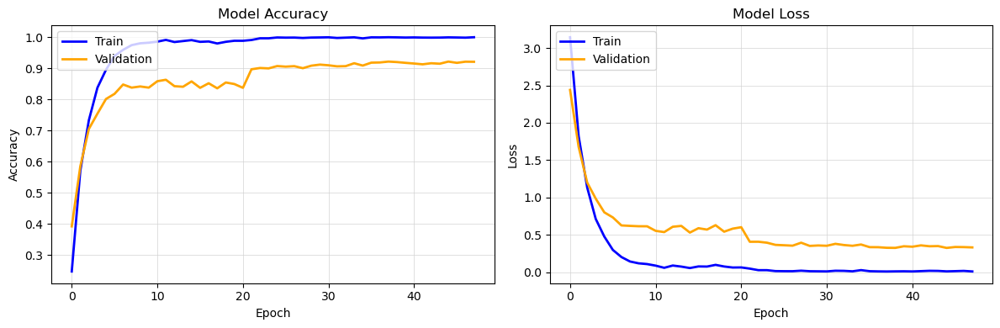

In [11]:
# Cell 9: Plot training loss and accuracy curves
plt.figure(figsize=(12, 4))

# Accuracy plot
plt.subplot(1, 2, 1)
plt.plot(train_history['train_acc'], label='Train', color='blue', linewidth=2)
plt.plot(train_history['val_acc'], label='Validation', color='orange', linewidth=2)
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(loc='upper left')
plt.grid(color='lightgray', linestyle='-', linewidth=0.5)

# Loss plot
plt.subplot(1, 2, 2)
plt.plot(train_history['train_loss'], label='Train', color='blue', linewidth=2)
plt.plot(train_history['val_loss'], label='Validation', color='orange', linewidth=2)
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(loc='upper left')
plt.grid(color='lightgray', linestyle='-', linewidth=0.5)

plt.tight_layout()
plt.show()


In [13]:
# Cell 10: Evaluate the model on the test set
model_resnet50.eval()
test_loss = 0.0
test_corrects = 0
test_total = 0
all_preds = []
all_labels = []

with torch.no_grad():
    for inputs, labels in tqdm(test_loader, desc="Testing"):
        inputs = inputs.to(device)
        labels = labels.to(device)
        outputs = model_resnet50(inputs)
        loss = criterion(outputs, labels)
        test_loss += loss.item() * inputs.size(0)
        _, preds = torch.max(outputs, 1)
        test_corrects += torch.sum(preds == labels.data)
        test_total += labels.size(0)
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

test_loss = test_loss / test_total
test_acc  = test_corrects.double() / test_total

print("Test Loss: {:.4f}".format(test_loss))
print("Test Accuracy: {:.4f}".format(test_acc))

# Print classification report and confusion matrix
print("Classification Report:\n", classification_report(all_labels, all_preds))



Testing: 100%|██████████| 117/117 [00:14<00:00,  7.95it/s]


Test Loss: 0.2946
Test Accuracy: 0.9278
Classification Report:
               precision    recall  f1-score   support

           0       0.94      0.82      0.88       108
           1       0.97      0.97      0.97       193
           2       0.95      0.86      0.90       149
           3       0.94      0.99      0.96       225
           4       0.95      0.96      0.96        80
           5       0.96      0.80      0.87        82
           6       0.93      0.91      0.92       278
           7       0.91      0.83      0.87        12
           8       0.97      0.85      0.90        33
           9       0.90      0.90      0.90       122
          10       0.94      0.79      0.86        42
          11       0.94      0.94      0.94        54
          12       0.93      0.93      0.93       225
          13       0.89      0.88      0.88       548
          14       0.92      0.97      0.94        70
          15       1.00      0.65      0.79        17
          16     

### Inception

In [14]:
# Cell 4: Data transforms and splitting dataset
# Define transforms (feel free to adjust augmentation parameters)
train_transforms = transforms.Compose([
    transforms.RandomResizedCrop(299, scale=(0.7, 1.0)),  # slightly wider range if needed
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(degrees=5),  # reduce rotation
    transforms.ColorJitter(brightness=0.1, contrast=0.1, saturation=0.1, hue=0.05),  # lower intensity
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225]),
    transforms.RandomErasing(p=0.1, scale=(0.02, 0.08), ratio=(0.3, 3.3))  # lower probability and scale
])

val_transforms = transforms.Compose([
    transforms.Resize((299, 299)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

# Split the training data into training and validation sets (80/20 split)
train_paths, val_paths, train_labels_split, val_labels_split = train_test_split(
    train_image_paths, train_labels, test_size=0.2, random_state=42
)


In [15]:
# Cell 5: Create DataLoaders
batch_size = 128

train_dataset = CarDataset(train_paths, train_labels_split, transform=train_transforms)
val_dataset   = CarDataset(val_paths, val_labels_split, transform=val_transforms)
test_dataset  = CarDataset(test_image_paths, test_labels, transform=val_transforms)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers= 16, pin_memory=True, prefetch_factor=2, persistent_workers=True)
val_loader   = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers= 16, pin_memory=True, prefetch_factor=2, persistent_workers=True)
test_loader  = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers= 16, pin_memory=True, prefetch_factor=2, persistent_workers=True)

print(f"Training dataset size: {len(train_dataset)}")
print(f"Validation dataset size: {len(val_dataset)}")
print(f"Test dataset size: {len(test_dataset)}")

Training dataset size: 12812
Validation dataset size: 3204
Test dataset size: 14939


In [20]:
# Cell 7: Define the model (ResNet50)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

model = models.inception_v3(pretrained=True, aux_logits=True)
num_ftrs = model.fc.in_features
model.fc = nn.Linear(num_ftrs, num_classes)  # modify the final layer
model_inception = model.to(device)

# Print a summary of the model
print(model_inception)


Using device: cuda


/data/anaconda3/lib/python3.12/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/data/anaconda3/lib/python3.12/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=Inception_V3_Weights.IMAGENET1K_V1`. You can also use `weights=Inception_V3_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Inception3(
  (Conv2d_1a_3x3): BasicConv2d(
    (conv): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), bias=False)
    (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (Conv2d_2a_3x3): BasicConv2d(
    (conv): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (Conv2d_2b_3x3): BasicConv2d(
    (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (maxpool1): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  (Conv2d_3b_1x1): BasicConv2d(
    (conv): Conv2d(64, 80, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(80, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (Conv2d_4a_3x3): BasicConv2d(
    (conv): Conv2d(80, 192, kernel_size=(3, 3), stri

In [21]:
# Cell 8: Training loop
num_epochs = 100
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model_inception.parameters(), lr=0.0001, weight_decay = 1e-3)
scheduler = lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=5, verbose=True)

# Early stopping parameters
early_stopping_patience = 10
best_val_acc = 0.0
epochs_no_improve = 0

train_history = {'train_loss': [], 'train_acc': [], 'val_loss': [], 'val_acc': []}

since = time.time()

for epoch in range(num_epochs):
    print(f"Epoch {epoch+1}/{num_epochs}")
    # --- Training phase ---
    model_inception.train()
    running_loss = 0.0
    running_corrects = 0
    total = 0
    
    for inputs, labels in tqdm(train_loader, desc="Training", leave=False):
        inputs = inputs.to(device)
        labels = labels.to(device)
        
        optimizer.zero_grad()
        outputs = model_inception(inputs)
        loss = criterion(outputs.logits, labels)
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item() * inputs.size(0)
        _, preds = torch.max(outputs.logits, 1)
        running_corrects += torch.sum(preds == labels.data)
        total += labels.size(0)
    
    epoch_loss = running_loss / total
    epoch_acc  = running_corrects.double() / total
    train_history['train_loss'].append(epoch_loss)
    train_history['train_acc'].append(epoch_acc.item())
    
    # --- Validation phase ---
    model_inception.eval()
    val_loss = 0.0
    val_corrects = 0
    val_total = 0
    
    with torch.no_grad():
        for inputs, labels in tqdm(val_loader, desc="Validation", leave=False):
            inputs = inputs.to(device)
            labels = labels.to(device)
            outputs = model_inception(inputs)
            loss = criterion(outputs, labels)
            val_loss += loss.item() * inputs.size(0)
            _, preds = torch.max(outputs, 1)
            val_corrects += torch.sum(preds == labels.data)
            val_total += labels.size(0)
    
    epoch_val_loss = val_loss / val_total
    epoch_val_acc  = val_corrects.double() / val_total
    train_history['val_loss'].append(epoch_val_loss)
    train_history['val_acc'].append(epoch_val_acc.item())
    
    print(f"Train Loss: {epoch_loss:.4f} Acc: {epoch_acc:.4f} | Val Loss: {epoch_val_loss:.4f} Acc: {epoch_val_acc:.4f}")
    
    scheduler.step(epoch_val_loss)
    
    # --- Early stopping ---
    if epoch_val_acc > best_val_acc + 1e-3:
        best_val_acc = epoch_val_acc
        epochs_no_improve = 0
        best_model_wts = model_inception.state_dict()
    else:
        epochs_no_improve += 1
        if epochs_no_improve >= early_stopping_patience:
            print("Early stopping triggered")
            break

time_elapsed = time.time() - since
print(f"Training complete in {time_elapsed // 60:.0f}m {time_elapsed % 60:.0f}s")
print(f"Best val Acc: {best_val_acc:.4f}")

# Load best model weights
model_inception.load_state_dict(best_model_wts)

# Save training history and model weights
with open('make_predictor_inception_history.pkl', 'wb') as f:
    pickle.dump(train_history, f)
torch.save(model_inception.state_dict(), 'make_predictor_inception.pth')


Epoch 1/100


Train Loss: 3.5493 Acc: 0.1610 | Val Loss: 3.0116 Acc: 0.2846
Epoch 2/100


Train Loss: 2.4599 Acc: 0.4160 | Val Loss: 2.1480 Acc: 0.4810
Epoch 3/100


Train Loss: 1.6325 Acc: 0.6198 | Val Loss: 1.5945 Acc: 0.6183
Epoch 4/100


Train Loss: 1.0555 Acc: 0.7559 | Val Loss: 1.2127 Acc: 0.7001
Epoch 5/100


Train Loss: 0.6885 Acc: 0.8462 | Val Loss: 0.9559 Acc: 0.7612
Epoch 6/100


Train Loss: 0.4538 Acc: 0.9022 | Val Loss: 0.7884 Acc: 0.8046
Epoch 7/100


Train Loss: 0.2996 Acc: 0.9394 | Val Loss: 0.7351 Acc: 0.8093
Epoch 8/100


Train Loss: 0.2022 Acc: 0.9595 | Val Loss: 0.7032 Acc: 0.8233
Epoch 9/100


Train Loss: 0.1506 Acc: 0.9710 | Val Loss: 0.5879 Acc: 0.8539
Epoch 10/100


Train Loss: 0.1467 Acc: 0.9739 | Val Loss: 0.5797 Acc: 0.8580
Epoch 11/100


Train Loss: 0.1080 Acc: 0.9784 | Val Loss: 0.5452 Acc: 0.8580
Epoch 12/100


Train Loss: 0.0973 Acc: 0.9824 | Val Loss: 0.5434 Acc: 0.8605
Epoch 13/100


Train Loss: 0.0732 Acc: 0.9867 | Val Loss: 0.5402 Acc: 0.8602
Epoch 14/100


Train Loss: 0.0522 Acc: 0.9926 | Val Loss: 0.5130 Acc: 0.8677
Epoch 15/100


Train Loss: 0.0439 Acc: 0.9933 | Val Loss: 0.5138 Acc: 0.8649
Epoch 16/100


Train Loss: 0.0587 Acc: 0.9899 | Val Loss: 0.5122 Acc: 0.8736
Epoch 17/100


Train Loss: 0.0863 Acc: 0.9821 | Val Loss: 0.5369 Acc: 0.8652
Epoch 18/100


Train Loss: 0.0584 Acc: 0.9888 | Val Loss: 0.5368 Acc: 0.8670
Epoch 19/100


Train Loss: 0.0427 Acc: 0.9924 | Val Loss: 0.4657 Acc: 0.8826
Epoch 20/100


Train Loss: 0.0418 Acc: 0.9918 | Val Loss: 0.4873 Acc: 0.8745
Epoch 21/100


Train Loss: 0.0322 Acc: 0.9942 | Val Loss: 0.4644 Acc: 0.8830
Epoch 22/100


Train Loss: 0.0610 Acc: 0.9873 | Val Loss: 0.5710 Acc: 0.8542
Epoch 23/100


Train Loss: 0.0586 Acc: 0.9877 | Val Loss: 0.5052 Acc: 0.8683
Epoch 24/100


Train Loss: 0.0449 Acc: 0.9909 | Val Loss: 0.4875 Acc: 0.8742
Epoch 25/100


Train Loss: 0.0452 Acc: 0.9913 | Val Loss: 0.5364 Acc: 0.8699
Epoch 26/100


Train Loss: 0.0564 Acc: 0.9884 | Val Loss: 0.5194 Acc: 0.8658
Epoch 27/100


Train Loss: 0.0677 Acc: 0.9868 | Val Loss: 0.4988 Acc: 0.8699
Epoch 28/100


Train Loss: 0.0263 Acc: 0.9963 | Val Loss: 0.3708 Acc: 0.9048
Epoch 29/100


Train Loss: 0.0150 Acc: 0.9980 | Val Loss: 0.3543 Acc: 0.9070
Epoch 30/100


Train Loss: 0.0176 Acc: 0.9977 | Val Loss: 0.3748 Acc: 0.9007
Epoch 31/100


Train Loss: 0.0130 Acc: 0.9981 | Val Loss: 0.3540 Acc: 0.9092
Epoch 32/100


Train Loss: 0.0099 Acc: 0.9988 | Val Loss: 0.3480 Acc: 0.9107
Epoch 33/100


Train Loss: 0.0208 Acc: 0.9967 | Val Loss: 0.3800 Acc: 0.9023
Epoch 34/100


Train Loss: 0.0141 Acc: 0.9980 | Val Loss: 0.3797 Acc: 0.9061
Epoch 35/100


Train Loss: 0.0144 Acc: 0.9977 | Val Loss: 0.3847 Acc: 0.9032
Epoch 36/100


Train Loss: 0.0164 Acc: 0.9977 | Val Loss: 0.3739 Acc: 0.9042
Epoch 37/100


Train Loss: 0.0135 Acc: 0.9980 | Val Loss: 0.3745 Acc: 0.9057
Epoch 38/100


Train Loss: 0.0128 Acc: 0.9986 | Val Loss: 0.3797 Acc: 0.9042
Epoch 39/100


Train Loss: 0.0104 Acc: 0.9984 | Val Loss: 0.3542 Acc: 0.9120
Epoch 40/100


Train Loss: 0.0101 Acc: 0.9988 | Val Loss: 0.3528 Acc: 0.9129
Epoch 41/100


Train Loss: 0.0120 Acc: 0.9982 | Val Loss: 0.3485 Acc: 0.9129
Epoch 42/100


Train Loss: 0.0085 Acc: 0.9991 | Val Loss: 0.3483 Acc: 0.9095
Epoch 43/100


Train Loss: 0.0106 Acc: 0.9982 | Val Loss: 0.3462 Acc: 0.9123
Epoch 44/100


Train Loss: 0.0075 Acc: 0.9993 | Val Loss: 0.3541 Acc: 0.9079
Epoch 45/100


Train Loss: 0.0085 Acc: 0.9994 | Val Loss: 0.3394 Acc: 0.9114
Epoch 46/100


Train Loss: 0.0081 Acc: 0.9993 | Val Loss: 0.3469 Acc: 0.9107
Epoch 47/100


Train Loss: 0.0102 Acc: 0.9985 | Val Loss: 0.3391 Acc: 0.9120
Epoch 48/100


Train Loss: 0.0098 Acc: 0.9988 | Val Loss: 0.3428 Acc: 0.9135
Epoch 49/100


Train Loss: 0.0125 Acc: 0.9981 | Val Loss: 0.3591 Acc: 0.9089
Epoch 50/100


Train Loss: 0.0104 Acc: 0.9992 | Val Loss: 0.3441 Acc: 0.9117
Epoch 51/100


Train Loss: 0.0097 Acc: 0.9988 | Val Loss: 0.3434 Acc: 0.9157
Epoch 52/100


Train Loss: 0.0086 Acc: 0.9992 | Val Loss: 0.3260 Acc: 0.9176
Epoch 53/100


Train Loss: 0.0082 Acc: 0.9994 | Val Loss: 0.3511 Acc: 0.9101
Epoch 54/100


Train Loss: 0.0170 Acc: 0.9974 | Val Loss: 0.3580 Acc: 0.9054
Epoch 55/100


Train Loss: 0.0117 Acc: 0.9985 | Val Loss: 0.3512 Acc: 0.9123
Epoch 56/100


Train Loss: 0.0092 Acc: 0.9994 | Val Loss: 0.3478 Acc: 0.9135
Epoch 57/100


Train Loss: 0.0151 Acc: 0.9980 | Val Loss: 0.3561 Acc: 0.9139
Epoch 58/100


Train Loss: 0.0173 Acc: 0.9977 | Val Loss: 0.3734 Acc: 0.9061
Epoch 59/100


Train Loss: 0.0097 Acc: 0.9991 | Val Loss: 0.3521 Acc: 0.9148
Epoch 60/100


Train Loss: 0.0094 Acc: 0.9986 | Val Loss: 0.3405 Acc: 0.9154
Epoch 61/100


Train Loss: 0.0080 Acc: 0.9992 | Val Loss: 0.3311 Acc: 0.9185
Epoch 62/100


Train Loss: 0.0097 Acc: 0.9991 | Val Loss: 0.3314 Acc: 0.9226
Epoch 63/100


Train Loss: 0.0071 Acc: 0.9993 | Val Loss: 0.3287 Acc: 0.9204
Epoch 64/100


Train Loss: 0.0093 Acc: 0.9991 | Val Loss: 0.3329 Acc: 0.9204
Epoch 65/100


Train Loss: 0.0082 Acc: 0.9995 | Val Loss: 0.3260 Acc: 0.9213
Epoch 66/100


Train Loss: 0.0072 Acc: 0.9994 | Val Loss: 0.3398 Acc: 0.9195
Epoch 67/100


Train Loss: 0.0082 Acc: 0.9993 | Val Loss: 0.3122 Acc: 0.9229
Epoch 68/100


Train Loss: 0.0069 Acc: 0.9995 | Val Loss: 0.3288 Acc: 0.9213
Epoch 69/100


Train Loss: 0.0086 Acc: 0.9991 | Val Loss: 0.3245 Acc: 0.9207
Epoch 70/100


Train Loss: 0.0080 Acc: 0.9991 | Val Loss: 0.3230 Acc: 0.9229
Epoch 71/100


Train Loss: 0.0067 Acc: 0.9996 | Val Loss: 0.3142 Acc: 0.9238
Epoch 72/100


Train Loss: 0.0073 Acc: 0.9993 | Val Loss: 0.3146 Acc: 0.9248
Epoch 73/100


Train Loss: 0.0067 Acc: 0.9995 | Val Loss: 0.3205 Acc: 0.9229
Epoch 74/100


Train Loss: 0.0064 Acc: 0.9993 | Val Loss: 0.3098 Acc: 0.9254
Epoch 75/100


Train Loss: 0.0063 Acc: 0.9996 | Val Loss: 0.3087 Acc: 0.9238
Epoch 76/100


Train Loss: 0.0069 Acc: 0.9993 | Val Loss: 0.3117 Acc: 0.9220
Epoch 77/100


Train Loss: 0.0065 Acc: 0.9993 | Val Loss: 0.3177 Acc: 0.9217
Epoch 78/100


Train Loss: 0.0064 Acc: 0.9996 | Val Loss: 0.3080 Acc: 0.9257
Epoch 79/100


Train Loss: 0.0069 Acc: 0.9995 | Val Loss: 0.3211 Acc: 0.9226
Epoch 80/100


Train Loss: 0.0062 Acc: 0.9996 | Val Loss: 0.3176 Acc: 0.9248
Epoch 81/100


Train Loss: 0.0063 Acc: 0.9995 | Val Loss: 0.3154 Acc: 0.9254
Epoch 82/100


Train Loss: 0.0066 Acc: 0.9995 | Val Loss: 0.3133 Acc: 0.9238
Epoch 83/100


Train Loss: 0.0057 Acc: 0.9998 | Val Loss: 0.3212 Acc: 0.9201
Epoch 84/100


Train Loss: 0.0070 Acc: 0.9992 | Val Loss: 0.3250 Acc: 0.9204
Early stopping triggered
Training complete in 84m 25s
Best val Acc: 0.9254


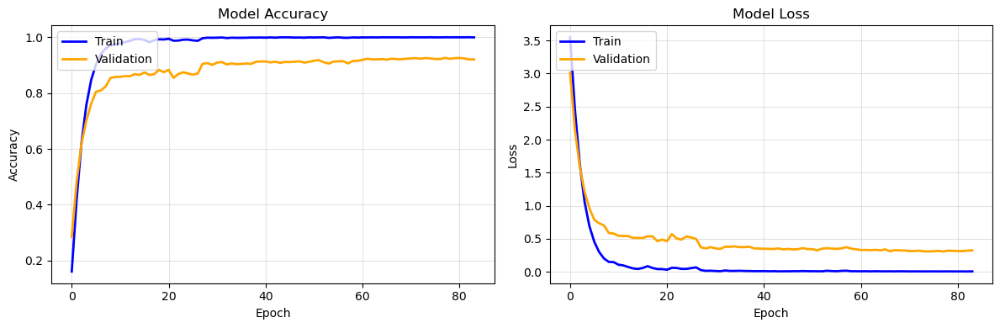

In [22]:
# Cell 9: Plot training loss and accuracy curves
plt.figure(figsize=(12, 4))

# Accuracy plot
plt.subplot(1, 2, 1)
plt.plot(train_history['train_acc'], label='Train', color='blue', linewidth=2)
plt.plot(train_history['val_acc'], label='Validation', color='orange', linewidth=2)
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(loc='upper left')
plt.grid(color='lightgray', linestyle='-', linewidth=0.5)

# Loss plot
plt.subplot(1, 2, 2)
plt.plot(train_history['train_loss'], label='Train', color='blue', linewidth=2)
plt.plot(train_history['val_loss'], label='Validation', color='orange', linewidth=2)
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(loc='upper left')
plt.grid(color='lightgray', linestyle='-', linewidth=0.5)

plt.tight_layout()
plt.show()


In [ ]:
# Cell 10: Evaluate the model on the test set
model_inception.eval()
test_loss = 0.0
test_corrects = 0
test_total = 0
all_preds = []
all_labels = []

with torch.no_grad():
    for inputs, labels in tqdm(test_loader, desc="Testing"):
        inputs = inputs.to(device)
        labels = labels.to(device)
        outputs = model_resnet50(inputs)
        loss = criterion(outputs, labels)
        test_loss += loss.item() * inputs.size(0)
        _, preds = torch.max(outputs, 1)
        test_corrects += torch.sum(preds == labels.data)
        test_total += labels.size(0)
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

test_loss = test_loss / test_total
test_acc  = test_corrects.double() / test_total

print("Test Loss: {:.4f}".format(test_loss))
print("Test Accuracy: {:.4f}".format(test_acc))

# Print classification report and confusion matrix
print("Classification Report:\n", classification_report(all_labels, all_preds))



Testing: 100%|██████████| 117/117 [00:27<00:00,  4.32it/s]

Test Loss: 0.4988
Test Accuracy: 0.9335
Classification Report:
               precision    recall  f1-score   support

           0       0.94      0.85      0.89       108
           1       0.95      0.99      0.97       193
           2       0.98      0.85      0.91       149
           3       0.98      0.99      0.98       225
           4       0.96      0.94      0.95        80
           5       0.92      0.83      0.87        82
           6       0.92      0.91      0.92       278
           7       1.00      0.67      0.80        12
           8       1.00      0.91      0.95        33
           9       0.92      0.89      0.91       122
          10       0.97      0.86      0.91        42
          11       0.91      0.94      0.93        54
          12       0.96      0.91      0.93       225
          13       0.87      0.92      0.89       548
          14       1.00      0.94      0.97        70
          15       1.00      0.71      0.83        17
          16     

: 